<a href="https://colab.research.google.com/github/Kiran-01/GAN-CGAN/blob/main/RPS_CGAN_PyTorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
! mkdir ~/.kaggle


In [2]:
! cp kaggle.json ~/.kaggle/


In [3]:
! chmod 600 ~/.kaggle/kaggle.json


In [4]:
! kaggle datasets download sanikamal/rock-paper-scissors-dataset


 97% 438M/452M [00:16<00:00, 18.4MB/s]
100% 452M/452M [00:16<00:00, 28.4MB/s]


In [5]:
! unzip /content/rock-paper-scissors-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Rock-Paper-Scissors/train/paper/paper04-118.png  
  inflating: Rock-Paper-Scissors/train/paper/paper04-119.png  
  inflating: Rock-Paper-Scissors/train/paper/paper05-000.png  
  inflating: Rock-Paper-Scissors/train/paper/paper05-001.png  
  inflating: Rock-Paper-Scissors/train/paper/paper05-002.png  
  inflating: Rock-Paper-Scissors/train/paper/paper05-003.png  
  inflating: Rock-Paper-Scissors/train/paper/paper05-004.png  
  inflating: Rock-Paper-Scissors/train/paper/paper05-005.png  
  inflating: Rock-Paper-Scissors/train/paper/paper05-006.png  
  inflating: Rock-Paper-Scissors/train/paper/paper05-007.png  
  inflating: Rock-Paper-Scissors/train/paper/paper05-008.png  
  inflating: Rock-Paper-Scissors/train/paper/paper05-009.png  
  inflating: Rock-Paper-Scissors/train/paper/paper05-010.png  
  inflating: Rock-Paper-Scissors/train/paper/paper05-011.png  
  inflating: Rock-Paper-Scissors/train/paper/paper05-012.png  
  in

In [6]:
!pip install torchsummary
!pip install gdown

In [7]:
import torch
import numpy as np
from PIL import Image
from IPython.display import display
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import Variable
from torchvision.utils import save_image
from torchvision.utils import make_grid
from torch.utils.tensorboard import SummaryWriter
# from torchsummary import summary
import matplotlib.pyplot as plt
import datetime
import os

In [8]:
torch.manual_seed(17)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
batch_size = 64

In [9]:
directory = '/content/Rock-Paper-Scissors/train'
n_classes = 3

train_transform = transforms.Compose([
    transforms.Resize((128, 128), interpolation=2),
    transforms.ToTensor(),
    transforms.Normalize([0.5,0.5,0.5], [0.5,0.5,0.5])])
train_dataset = datasets.ImageFolder(root=directory, transform=train_transform)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:288: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "


In [10]:
def show_images(images):
    fig, ax = plt.subplots(figsize=(64, 64))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(images.detach(), nrow=8).permute(1, 2, 0))

def show_batch(dl):
    for images, _ in dl:
        show_images(images)
        break

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


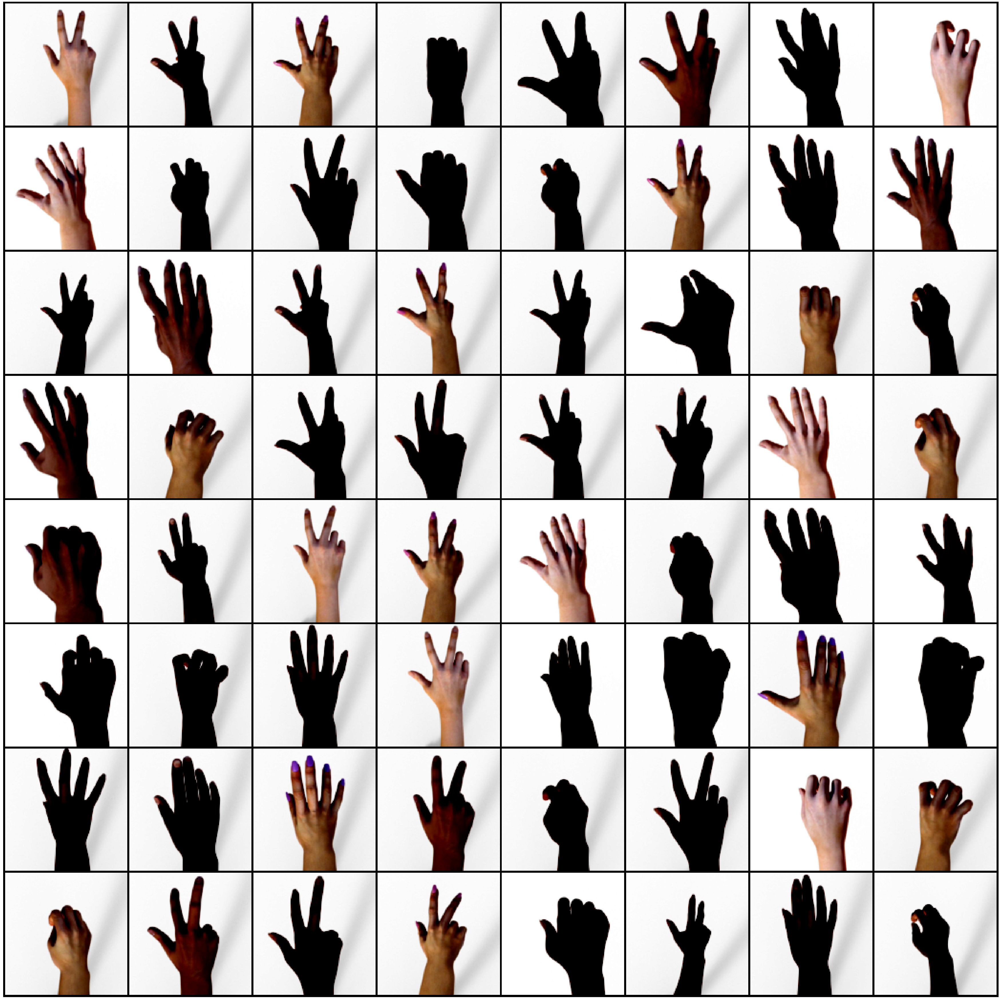

In [11]:
show_batch(train_loader)

In [12]:
image_shape = (3, 128, 128)
image_dim = int(np.prod(image_shape))
latent_dim = 100
embedding_dim = 100

In [13]:
#definemodel
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        torch.nn.init.normal_(m.weight, 1.0, 0.02)
        torch.nn.init.zeros_(m.bias)

In [14]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.label_conditioned_generator = nn.Sequential(nn.Embedding(n_classes, embedding_dim),
                      nn.Linear(embedding_dim, 16))
        self.latent = nn.Sequential(nn.Linear(latent_dim, 4*4*512),
                                   nn.LeakyReLU(0.2, inplace=True))
        self.model = nn.Sequential(nn.ConvTranspose2d(513, 64*8, 4, 2, 1, bias=False),
                      nn.BatchNorm2d(64*8, momentum=0.1,  eps=0.8),
                      nn.ReLU(True),
                      nn.ConvTranspose2d(64*8, 64*4, 4, 2, 1,bias=False),
                      nn.BatchNorm2d(64*4, momentum=0.1,  eps=0.8),
                      nn.ReLU(True), 
                      nn.ConvTranspose2d(64*4, 64*2, 4, 2, 1,bias=False),
                      nn.BatchNorm2d(64*2, momentum=0.1,  eps=0.8),
                      nn.ReLU(True), 
                      nn.ConvTranspose2d(64*2, 64*1, 4, 2, 1,bias=False),
                      nn.BatchNorm2d(64*1, momentum=0.1,  eps=0.8),
                      nn.ReLU(True), 
                      nn.ConvTranspose2d(64*1, 3, 4, 2, 1, bias=False),
                      nn.Tanh())

    def forward(self, inputs):
        noise_vector, label = inputs
        label_output = self.label_conditioned_generator(label)
        label_output = label_output.view(-1, 1, 4, 4)
        latent_output = self.latent(noise_vector)
        latent_output = latent_output.view(-1, 512,4,4)
        concat = torch.cat((latent_output, label_output), dim=1)
        image = self.model(concat)
        #print(image.size())
        return image

In [15]:
generator = Generator().to(device)
generator.apply(weights_init)
print(generator)

Generator(
  (label_conditioned_generator): Sequential(
    (0): Embedding(3, 100)
    (1): Linear(in_features=100, out_features=16, bias=True)
  )
  (latent): Sequential(
    (0): Linear(in_features=100, out_features=8192, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (model): Sequential(
    (0): ConvTranspose2d(513, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_si

In [16]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        self.label_condition_disc = nn.Sequential(nn.Embedding(n_classes, embedding_dim),
                      nn.Linear(embedding_dim, 3*128*128))
             
        self.model = nn.Sequential(nn.Conv2d(6, 64, 4, 2, 1, bias=False),
                      nn.LeakyReLU(0.2, inplace=True),
                      nn.Conv2d(64, 64*2, 4, 3, 2, bias=False),
                      nn.BatchNorm2d(64*2, momentum=0.1,  eps=0.8),
                      nn.LeakyReLU(0.2, inplace=True),
                      nn.Conv2d(64*2, 64*4, 4, 3,2, bias=False),
                      nn.BatchNorm2d(64*4, momentum=0.1,  eps=0.8),
                      nn.LeakyReLU(0.2, inplace=True),
                      nn.Conv2d(64*4, 64*8, 4, 3, 2, bias=False),
                      nn.BatchNorm2d(64*8, momentum=0.1,  eps=0.8),
                      nn.LeakyReLU(0.2, inplace=True), 
                      nn.Flatten(),
                      nn.Dropout(0.4),
                      nn.Linear(4608, 1),
                      nn.Sigmoid())

    def forward(self, inputs):
        img, label = inputs
        label_output = self.label_condition_disc(label)
        label_output = label_output.view(-1, 3, 128, 128)
        concat = torch.cat((img, label_output), dim=1)
        #print(concat.size())
        output = self.model(concat)
        return output

In [17]:
discriminator = Discriminator().to(device)
discriminator.apply(weights_init)
print(discriminator)

Discriminator(
  (label_condition_disc): Sequential(
    (0): Embedding(3, 100)
    (1): Linear(in_features=100, out_features=49152, bias=True)
  )
  (model): Sequential(
    (0): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(3, 3), padding=(2, 2), bias=False)
    (3): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(3, 3), padding=(2, 2), bias=False)
    (6): BatchNorm2d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(3, 3), padding=(2, 2), bias=False)
    (9): BatchNorm2d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)


In [18]:
adversarial_loss = nn.BCELoss()

def generator_loss(fake_output, label):
    gen_loss = adversarial_loss(fake_output, label)
    return gen_loss

def discriminator_loss(output, label):
    disc_loss = adversarial_loss(output, label)
    return disc_loss

In [19]:
learning_rate = 0.0002 
G_optimizer = optim.Adam(generator.parameters(), lr = learning_rate, betas=(0.5, 0.999))
D_optimizer = optim.Adam(discriminator.parameters(), lr = learning_rate, betas=(0.5, 0.999))

Epoch: [1/200]: D_loss: 0.314, G_loss: 1.843
Epoch: [2/200]: D_loss: 0.364, G_loss: 1.954
Epoch: [3/200]: D_loss: 0.459, G_loss: 1.656
Epoch: [4/200]: D_loss: 0.432, G_loss: 1.560
Epoch: [5/200]: D_loss: 0.409, G_loss: 1.902
Epoch: [6/200]: D_loss: 0.444, G_loss: 2.104
Epoch: [7/200]: D_loss: 0.551, G_loss: 1.621
Epoch: [8/200]: D_loss: 0.456, G_loss: 1.586
Epoch: [9/200]: D_loss: 0.439, G_loss: 1.764
Epoch: [10/200]: D_loss: 0.428, G_loss: 1.853
Saving sample output Sample_epoch_10.png


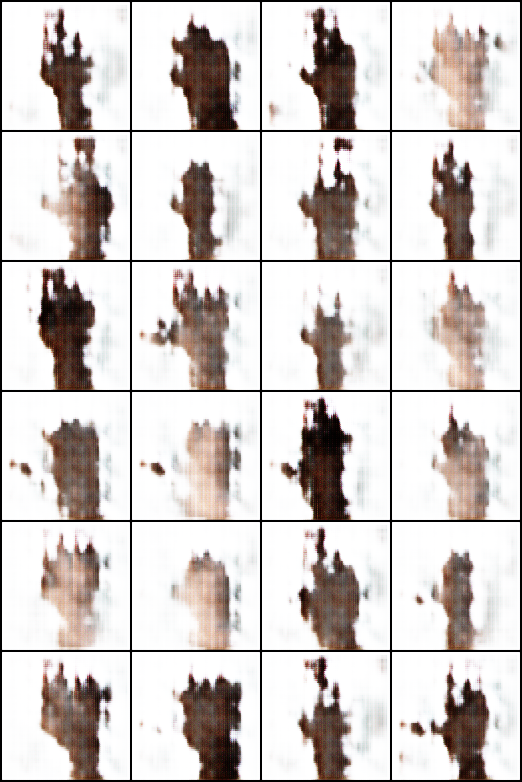

Saving model training check point
Epoch: [11/200]: D_loss: 0.430, G_loss: 1.849
Epoch: [12/200]: D_loss: 0.439, G_loss: 1.947
Epoch: [13/200]: D_loss: 0.433, G_loss: 1.977
Epoch: [14/200]: D_loss: 0.377, G_loss: 2.096
Epoch: [15/200]: D_loss: 0.445, G_loss: 1.958
Epoch: [16/200]: D_loss: 0.401, G_loss: 1.923
Epoch: [17/200]: D_loss: 0.452, G_loss: 1.725
Epoch: [18/200]: D_loss: 0.447, G_loss: 1.586
Epoch: [19/200]: D_loss: 0.435, G_loss: 1.603
Epoch: [20/200]: D_loss: 0.445, G_loss: 1.675
Saving sample output Sample_epoch_20.png


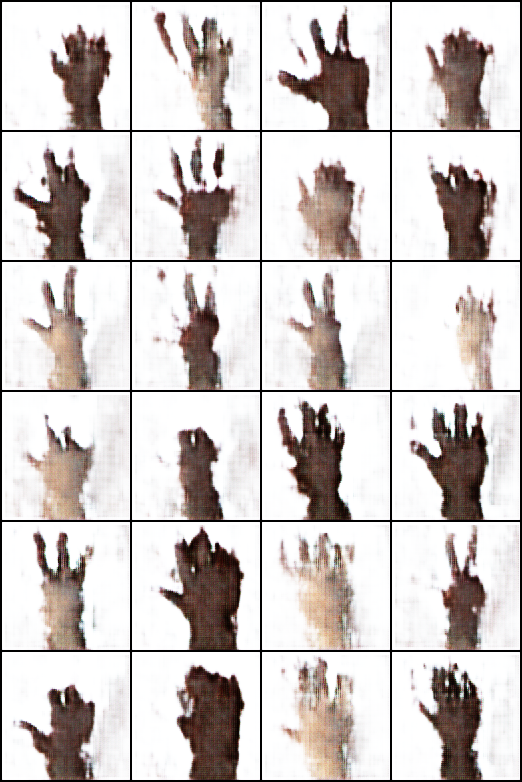

Saving model training check point
Epoch: [21/200]: D_loss: 0.424, G_loss: 1.656
Epoch: [22/200]: D_loss: 0.405, G_loss: 1.723
Epoch: [23/200]: D_loss: 0.410, G_loss: 1.766
Epoch: [24/200]: D_loss: 0.419, G_loss: 1.879
Epoch: [25/200]: D_loss: 0.401, G_loss: 1.926
Epoch: [26/200]: D_loss: 0.370, G_loss: 1.881
Epoch: [27/200]: D_loss: 0.401, G_loss: 2.000
Epoch: [28/200]: D_loss: 0.373, G_loss: 1.996
Epoch: [29/200]: D_loss: 0.509, G_loss: 2.276
Epoch: [30/200]: D_loss: 0.342, G_loss: 1.994
Saving sample output Sample_epoch_30.png


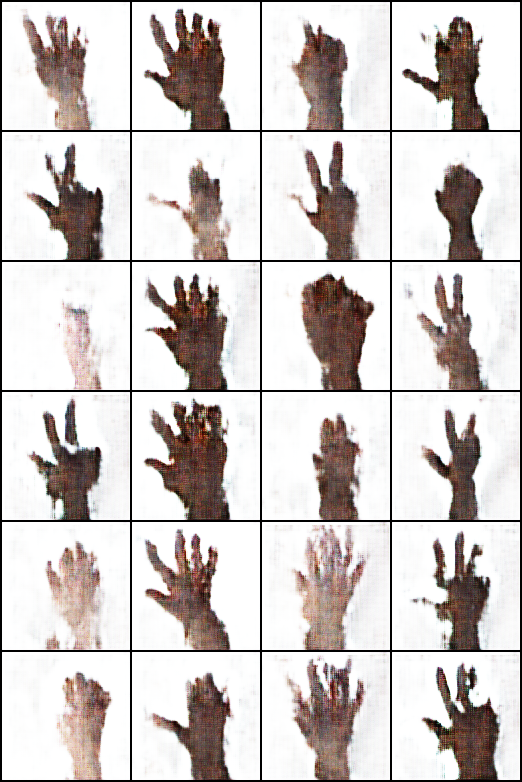

Saving model training check point
Epoch: [31/200]: D_loss: 0.322, G_loss: 2.097
Epoch: [32/200]: D_loss: 0.340, G_loss: 2.155
Epoch: [33/200]: D_loss: 0.388, G_loss: 2.099
Epoch: [34/200]: D_loss: 0.340, G_loss: 2.238
Epoch: [35/200]: D_loss: 0.318, G_loss: 2.225
Epoch: [36/200]: D_loss: 0.323, G_loss: 2.317
Epoch: [37/200]: D_loss: 0.489, G_loss: 2.539
Epoch: [38/200]: D_loss: 0.311, G_loss: 2.200
Epoch: [39/200]: D_loss: 0.294, G_loss: 2.303
Epoch: [40/200]: D_loss: 0.324, G_loss: 2.348
Saving sample output Sample_epoch_40.png


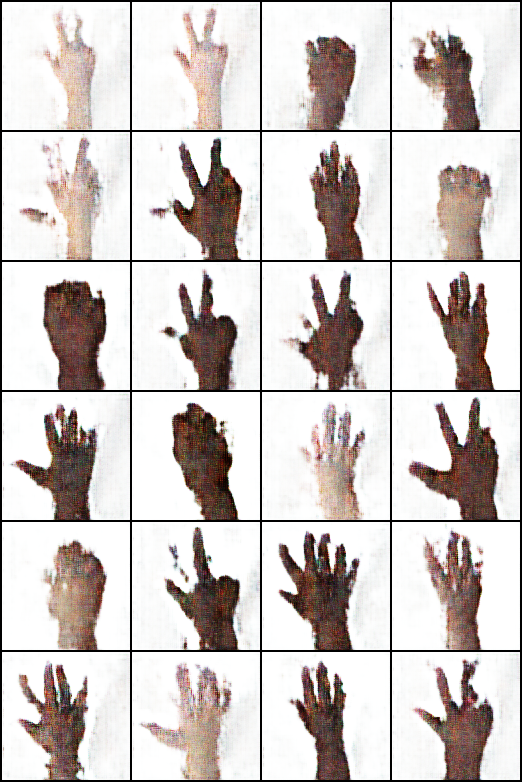

Saving model training check point
Epoch: [41/200]: D_loss: 0.336, G_loss: 2.336
Epoch: [42/200]: D_loss: 0.285, G_loss: 2.398
Epoch: [43/200]: D_loss: 0.388, G_loss: 2.533
Epoch: [44/200]: D_loss: 0.265, G_loss: 2.452
Epoch: [45/200]: D_loss: 0.286, G_loss: 2.471
Epoch: [46/200]: D_loss: 0.347, G_loss: 2.698
Epoch: [47/200]: D_loss: 0.253, G_loss: 2.633
Epoch: [48/200]: D_loss: 0.255, G_loss: 2.729
Epoch: [49/200]: D_loss: 0.315, G_loss: 2.822
Epoch: [50/200]: D_loss: 0.288, G_loss: 2.681
Saving sample output Sample_epoch_50.png


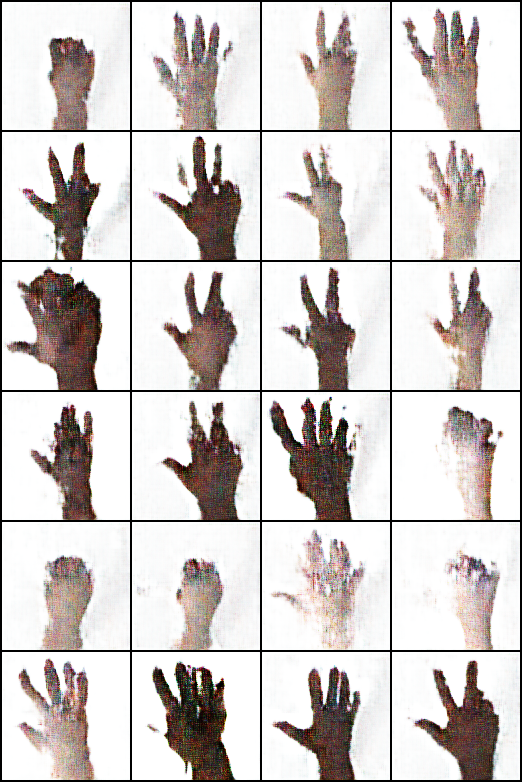

Saving model training check point
Epoch: [51/200]: D_loss: 0.242, G_loss: 2.780
Epoch: [52/200]: D_loss: 0.309, G_loss: 2.785
Epoch: [53/200]: D_loss: 0.234, G_loss: 2.806
Epoch: [54/200]: D_loss: 0.247, G_loss: 2.902
Epoch: [55/200]: D_loss: 0.651, G_loss: 2.881
Epoch: [56/200]: D_loss: 0.256, G_loss: 2.714
Epoch: [57/200]: D_loss: 0.225, G_loss: 2.830
Epoch: [58/200]: D_loss: 0.233, G_loss: 2.904
Epoch: [59/200]: D_loss: 0.238, G_loss: 2.950
Epoch: [60/200]: D_loss: 0.218, G_loss: 3.052
Saving sample output Sample_epoch_60.png


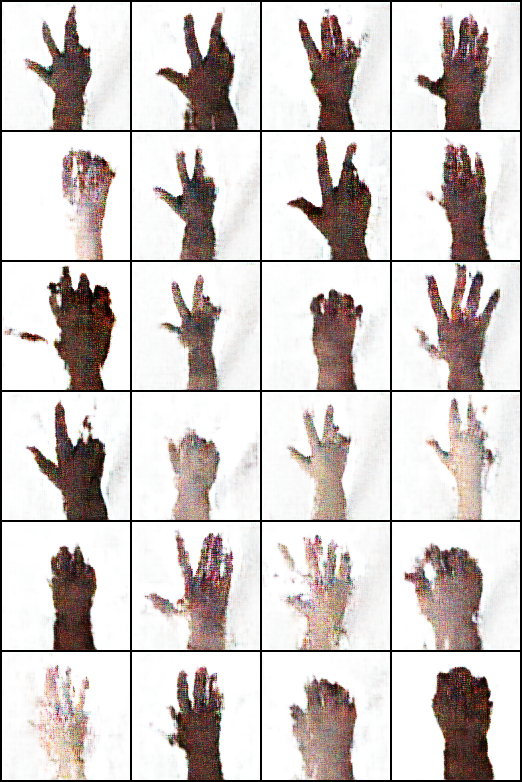

Saving model training check point
Epoch: [61/200]: D_loss: 0.220, G_loss: 3.053
Epoch: [62/200]: D_loss: 0.372, G_loss: 3.130
Epoch: [63/200]: D_loss: 0.213, G_loss: 3.035
Epoch: [64/200]: D_loss: 0.219, G_loss: 3.075
Epoch: [65/200]: D_loss: 0.221, G_loss: 3.128
Epoch: [66/200]: D_loss: 0.225, G_loss: 3.227
Epoch: [67/200]: D_loss: 0.222, G_loss: 3.222
Epoch: [68/200]: D_loss: 0.193, G_loss: 3.165
Epoch: [69/200]: D_loss: 0.215, G_loss: 3.265
Epoch: [70/200]: D_loss: 0.176, G_loss: 3.393
Saving sample output Sample_epoch_70.png


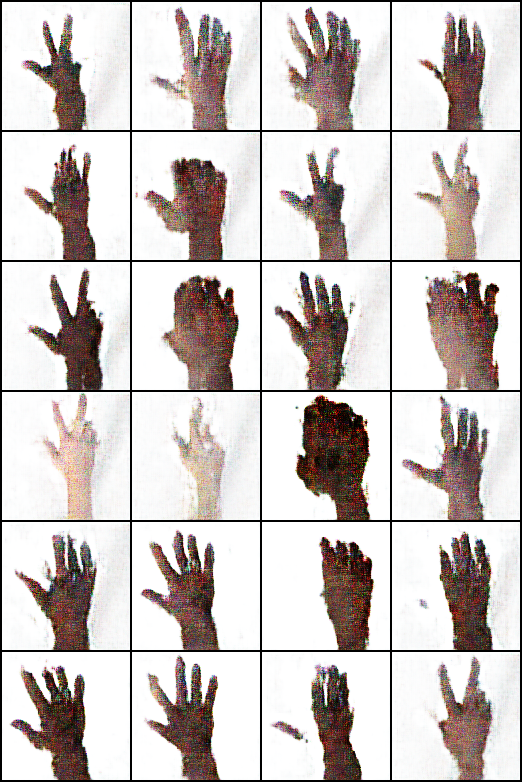

Saving model training check point
Epoch: [71/200]: D_loss: 0.294, G_loss: 3.423
Epoch: [72/200]: D_loss: 0.190, G_loss: 3.437
Epoch: [73/200]: D_loss: 0.192, G_loss: 3.400
Epoch: [74/200]: D_loss: 0.242, G_loss: 3.501
Epoch: [75/200]: D_loss: 0.217, G_loss: 3.440
Epoch: [76/200]: D_loss: 0.210, G_loss: 3.587
Epoch: [77/200]: D_loss: 0.198, G_loss: 3.613
Epoch: [78/200]: D_loss: 0.175, G_loss: 3.590
Epoch: [79/200]: D_loss: 0.200, G_loss: 3.559
Epoch: [80/200]: D_loss: 0.323, G_loss: 3.532
Saving sample output Sample_epoch_80.png


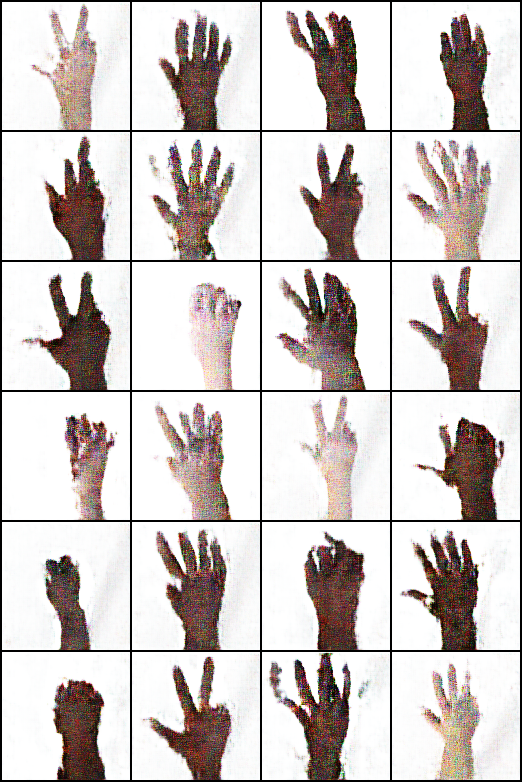

Saving model training check point
Epoch: [81/200]: D_loss: 0.164, G_loss: 3.634
Epoch: [82/200]: D_loss: 0.205, G_loss: 3.690
Epoch: [83/200]: D_loss: 0.172, G_loss: 3.614
Epoch: [84/200]: D_loss: 0.169, G_loss: 3.831
Epoch: [85/200]: D_loss: 0.328, G_loss: 3.693
Epoch: [86/200]: D_loss: 0.175, G_loss: 3.683
Epoch: [87/200]: D_loss: 0.146, G_loss: 3.777
Epoch: [88/200]: D_loss: 0.314, G_loss: 3.693
Epoch: [89/200]: D_loss: 0.190, G_loss: 3.739
Epoch: [90/200]: D_loss: 0.149, G_loss: 3.803
Saving sample output Sample_epoch_90.png


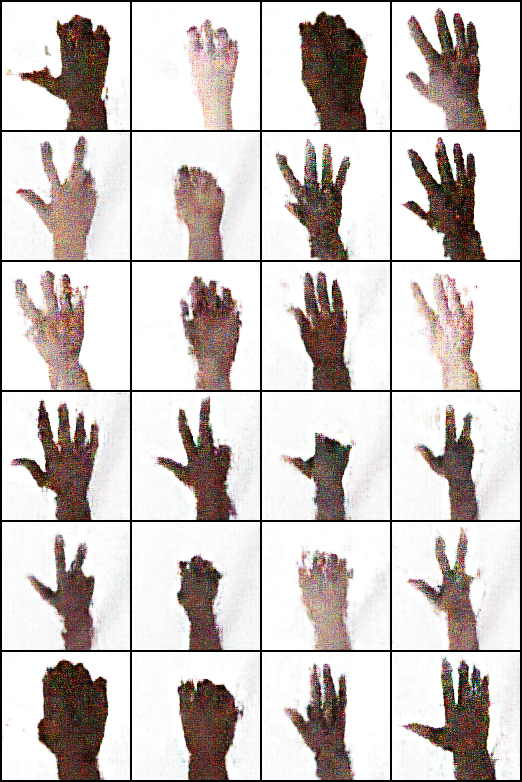

Saving model training check point
Epoch: [91/200]: D_loss: 0.154, G_loss: 3.861
Epoch: [92/200]: D_loss: 0.152, G_loss: 3.961
Epoch: [93/200]: D_loss: 0.150, G_loss: 4.075
Epoch: [94/200]: D_loss: 0.310, G_loss: 3.868
Epoch: [95/200]: D_loss: 0.160, G_loss: 3.876
Epoch: [96/200]: D_loss: 0.161, G_loss: 3.915
Epoch: [97/200]: D_loss: 0.226, G_loss: 3.926
Epoch: [98/200]: D_loss: 0.148, G_loss: 3.890
Epoch: [99/200]: D_loss: 0.297, G_loss: 3.886
Epoch: [100/200]: D_loss: 0.147, G_loss: 4.000
Saving sample output Sample_epoch_100.png


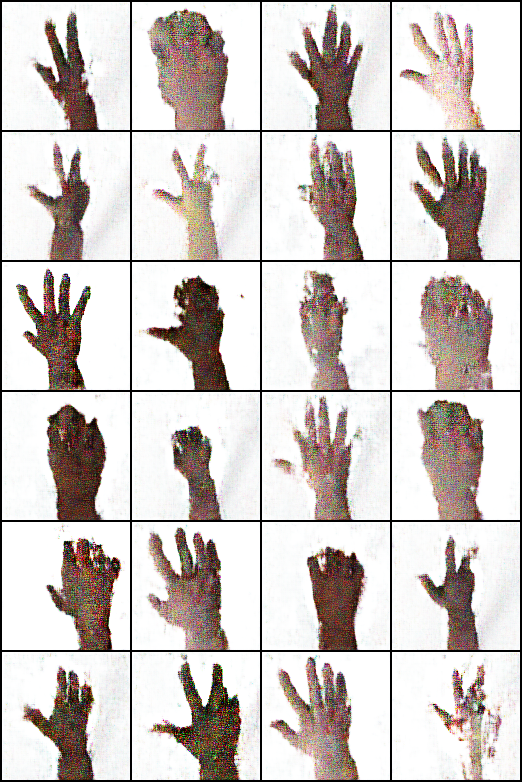

Saving model training check point
Epoch: [101/200]: D_loss: 0.138, G_loss: 4.032
Epoch: [102/200]: D_loss: 0.167, G_loss: 4.016
Epoch: [103/200]: D_loss: 0.237, G_loss: 3.962
Epoch: [104/200]: D_loss: 0.156, G_loss: 4.062
Epoch: [105/200]: D_loss: 0.226, G_loss: 4.079
Epoch: [106/200]: D_loss: 0.146, G_loss: 4.076
Epoch: [107/200]: D_loss: 0.176, G_loss: 4.236
Epoch: [108/200]: D_loss: 0.158, G_loss: 4.195
Epoch: [109/200]: D_loss: 0.169, G_loss: 4.280
Epoch: [110/200]: D_loss: 0.230, G_loss: 4.243
Saving sample output Sample_epoch_110.png


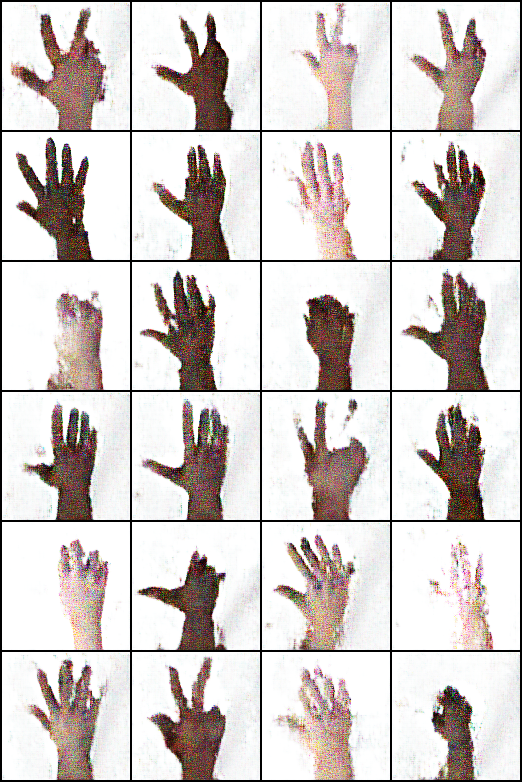

Saving model training check point
Epoch: [111/200]: D_loss: 0.137, G_loss: 4.069
Epoch: [112/200]: D_loss: 0.158, G_loss: 4.307
Epoch: [113/200]: D_loss: 0.145, G_loss: 4.208
Epoch: [114/200]: D_loss: 0.140, G_loss: 4.418
Epoch: [115/200]: D_loss: 0.159, G_loss: 4.352
Epoch: [116/200]: D_loss: 0.140, G_loss: 4.399
Epoch: [117/200]: D_loss: 0.489, G_loss: 4.135
Epoch: [118/200]: D_loss: 0.144, G_loss: 4.107
Epoch: [119/200]: D_loss: 0.116, G_loss: 4.220
Epoch: [120/200]: D_loss: 0.174, G_loss: 4.433
Saving sample output Sample_epoch_120.png


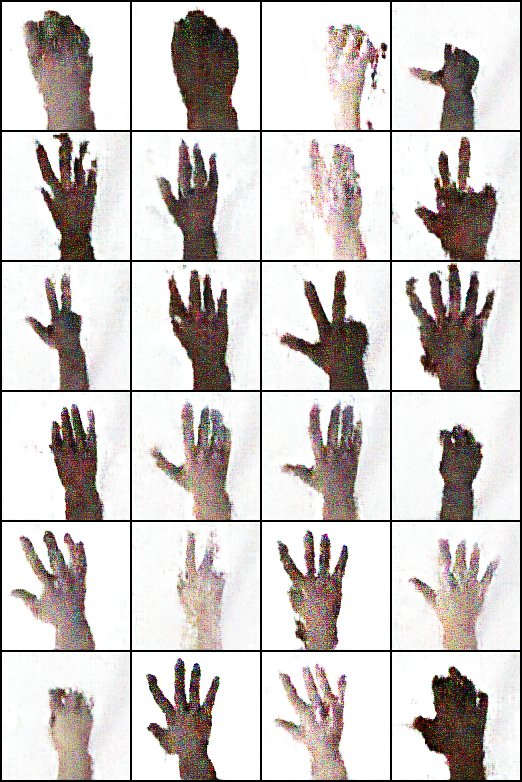

Saving model training check point
Epoch: [121/200]: D_loss: 0.188, G_loss: 4.176
Epoch: [122/200]: D_loss: 0.123, G_loss: 4.311
Epoch: [123/200]: D_loss: 0.137, G_loss: 4.469
Epoch: [124/200]: D_loss: 0.117, G_loss: 4.554
Epoch: [125/200]: D_loss: 0.152, G_loss: 4.530
Epoch: [126/200]: D_loss: 0.415, G_loss: 4.250
Epoch: [127/200]: D_loss: 0.152, G_loss: 4.100
Epoch: [128/200]: D_loss: 0.119, G_loss: 4.388
Epoch: [129/200]: D_loss: 0.126, G_loss: 4.451
Epoch: [130/200]: D_loss: 0.112, G_loss: 4.576
Saving sample output Sample_epoch_130.png


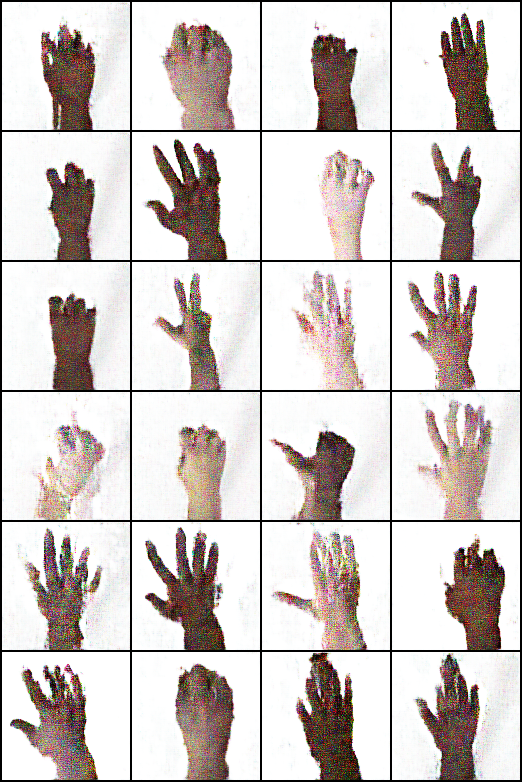

Saving model training check point
Epoch: [131/200]: D_loss: 0.139, G_loss: 4.677
Epoch: [132/200]: D_loss: 0.153, G_loss: 4.503
Epoch: [133/200]: D_loss: 0.154, G_loss: 4.596
Epoch: [134/200]: D_loss: 0.287, G_loss: 4.409
Epoch: [135/200]: D_loss: 0.139, G_loss: 4.478
Epoch: [136/200]: D_loss: 0.116, G_loss: 4.628
Epoch: [137/200]: D_loss: 0.105, G_loss: 4.647
Epoch: [138/200]: D_loss: 0.110, G_loss: 4.694
Epoch: [139/200]: D_loss: 0.117, G_loss: 4.723
Epoch: [140/200]: D_loss: 0.125, G_loss: 4.774
Saving sample output Sample_epoch_140.png


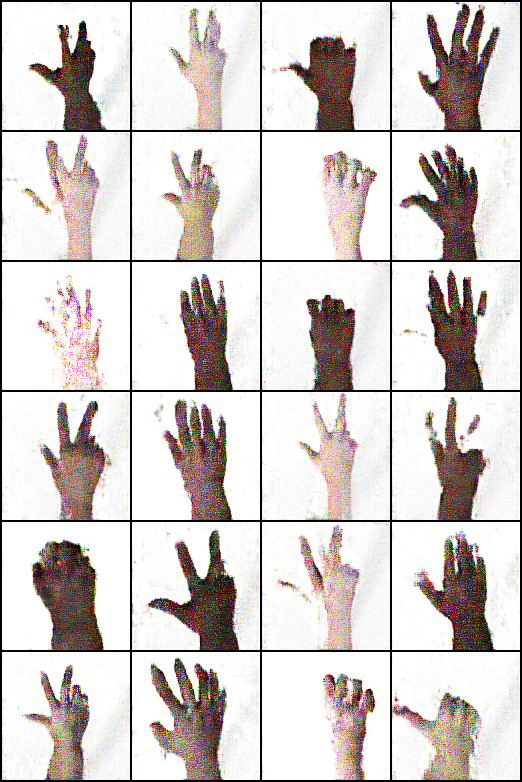

Saving model training check point
Epoch: [141/200]: D_loss: 0.115, G_loss: 4.839
Epoch: [142/200]: D_loss: 0.608, G_loss: 4.002
Epoch: [143/200]: D_loss: 0.128, G_loss: 4.190
Epoch: [144/200]: D_loss: 0.103, G_loss: 4.543
Epoch: [145/200]: D_loss: 0.110, G_loss: 4.710
Epoch: [146/200]: D_loss: 0.106, G_loss: 4.623
Epoch: [147/200]: D_loss: 0.275, G_loss: 4.457
Epoch: [148/200]: D_loss: 0.137, G_loss: 4.522
Epoch: [149/200]: D_loss: 0.110, G_loss: 4.765
Epoch: [150/200]: D_loss: 0.110, G_loss: 4.801
Saving sample output Sample_epoch_150.png


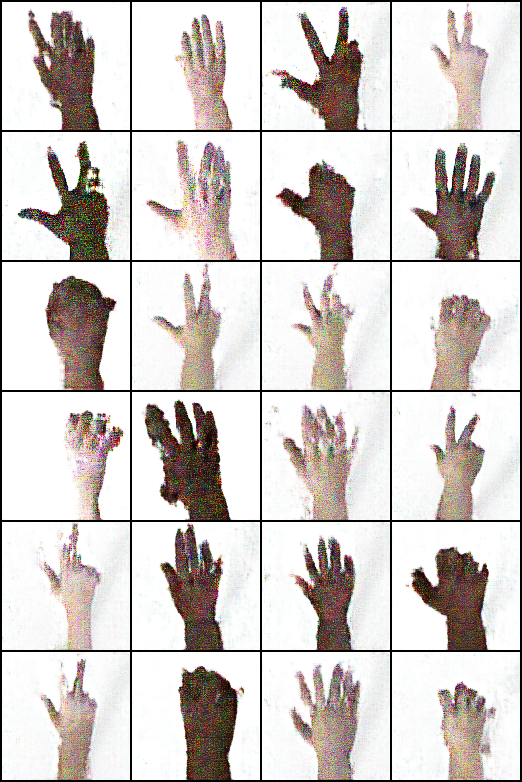

Saving model training check point
Epoch: [151/200]: D_loss: 0.118, G_loss: 4.830
Epoch: [152/200]: D_loss: 0.133, G_loss: 4.804
Epoch: [153/200]: D_loss: 0.174, G_loss: 4.817
Epoch: [154/200]: D_loss: 0.149, G_loss: 4.840
Epoch: [155/200]: D_loss: 0.134, G_loss: 4.840
Epoch: [156/200]: D_loss: 0.145, G_loss: 4.943
Epoch: [157/200]: D_loss: 0.150, G_loss: 4.829
Epoch: [158/200]: D_loss: 0.134, G_loss: 4.938
Epoch: [159/200]: D_loss: 0.091, G_loss: 5.036
Epoch: [160/200]: D_loss: 0.614, G_loss: 4.409
Saving sample output Sample_epoch_160.png


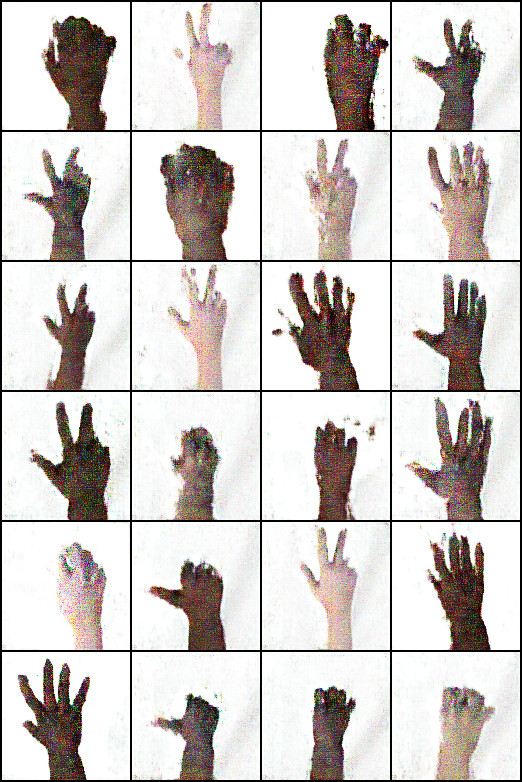

Saving model training check point
Epoch: [161/200]: D_loss: 0.206, G_loss: 4.126
Epoch: [162/200]: D_loss: 0.113, G_loss: 4.391
Epoch: [163/200]: D_loss: 0.137, G_loss: 4.822
Epoch: [164/200]: D_loss: 0.130, G_loss: 4.629
Epoch: [165/200]: D_loss: 0.093, G_loss: 4.939
Epoch: [166/200]: D_loss: 0.171, G_loss: 4.746
Epoch: [167/200]: D_loss: 0.120, G_loss: 4.897
Epoch: [168/200]: D_loss: 0.133, G_loss: 4.944
Epoch: [169/200]: D_loss: 0.135, G_loss: 4.887
Epoch: [170/200]: D_loss: 0.110, G_loss: 5.048
Saving sample output Sample_epoch_170.png


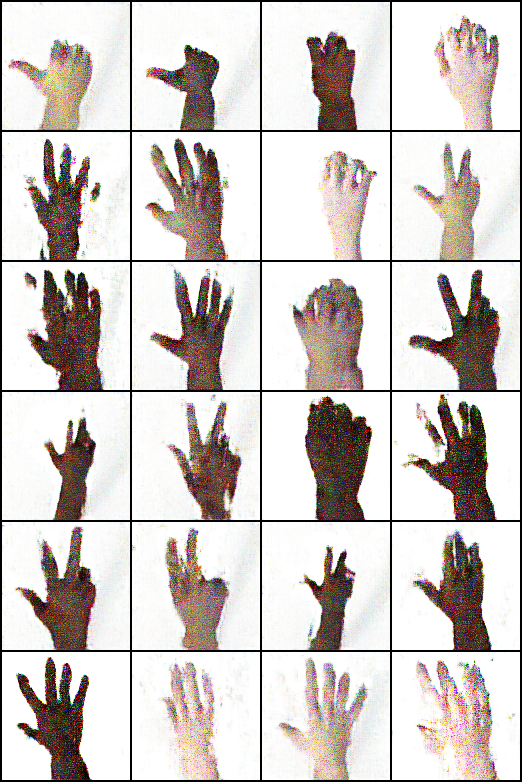

Saving model training check point
Epoch: [171/200]: D_loss: 0.120, G_loss: 5.018
Epoch: [172/200]: D_loss: 0.165, G_loss: 4.905
Epoch: [173/200]: D_loss: 0.366, G_loss: 4.490
Epoch: [174/200]: D_loss: 0.125, G_loss: 4.649
Epoch: [175/200]: D_loss: 0.110, G_loss: 5.026
Epoch: [176/200]: D_loss: 0.084, G_loss: 5.070
Epoch: [177/200]: D_loss: 0.092, G_loss: 5.092
Epoch: [178/200]: D_loss: 0.105, G_loss: 5.078
Epoch: [179/200]: D_loss: 0.243, G_loss: 5.299
Epoch: [180/200]: D_loss: 0.221, G_loss: 4.530
Saving sample output Sample_epoch_180.png


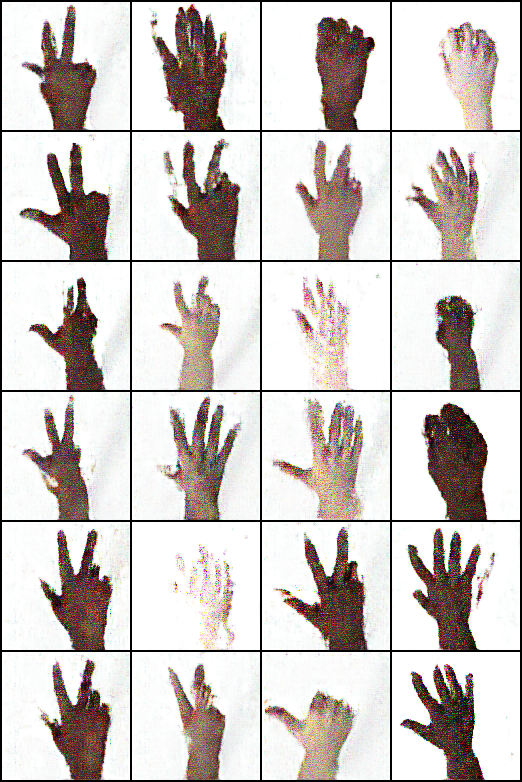

Saving model training check point
Epoch: [181/200]: D_loss: 0.167, G_loss: 4.808
Epoch: [182/200]: D_loss: 0.134, G_loss: 4.862
Epoch: [183/200]: D_loss: 0.203, G_loss: 4.649
Epoch: [184/200]: D_loss: 0.091, G_loss: 4.929
Epoch: [185/200]: D_loss: 0.143, G_loss: 5.037
Epoch: [186/200]: D_loss: 0.834, G_loss: 3.107
Epoch: [187/200]: D_loss: 0.181, G_loss: 3.989
Epoch: [188/200]: D_loss: 0.112, G_loss: 4.573
Epoch: [189/200]: D_loss: 0.077, G_loss: 4.858
Epoch: [190/200]: D_loss: 0.122, G_loss: 4.772
Saving sample output Sample_epoch_190.png


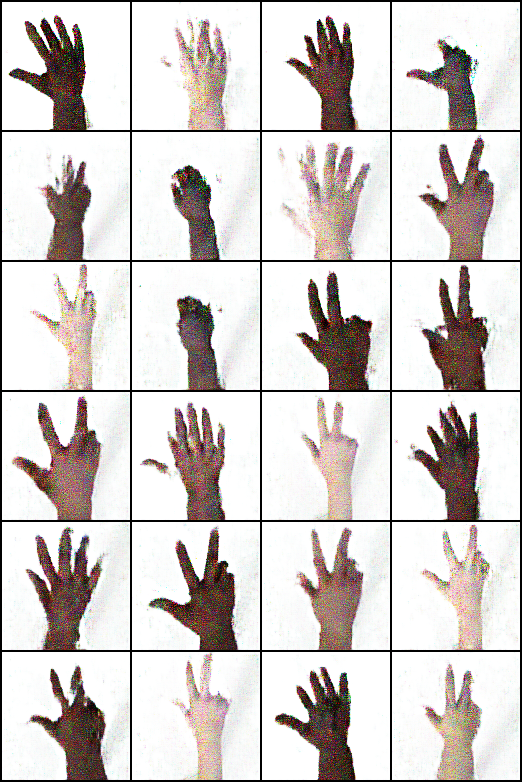

Saving model training check point
Epoch: [191/200]: D_loss: 0.092, G_loss: 4.861
Epoch: [192/200]: D_loss: 0.088, G_loss: 5.123
Epoch: [193/200]: D_loss: 0.094, G_loss: 5.141
Epoch: [194/200]: D_loss: 0.102, G_loss: 5.123
Epoch: [195/200]: D_loss: 0.092, G_loss: 5.239
Epoch: [196/200]: D_loss: 0.081, G_loss: 5.194
Epoch: [197/200]: D_loss: 0.321, G_loss: 4.806
Epoch: [198/200]: D_loss: 0.513, G_loss: 3.552
Epoch: [199/200]: D_loss: 0.154, G_loss: 4.407
Epoch: [200/200]: D_loss: 0.126, G_loss: 4.815
Saving sample output Sample_epoch_200.png


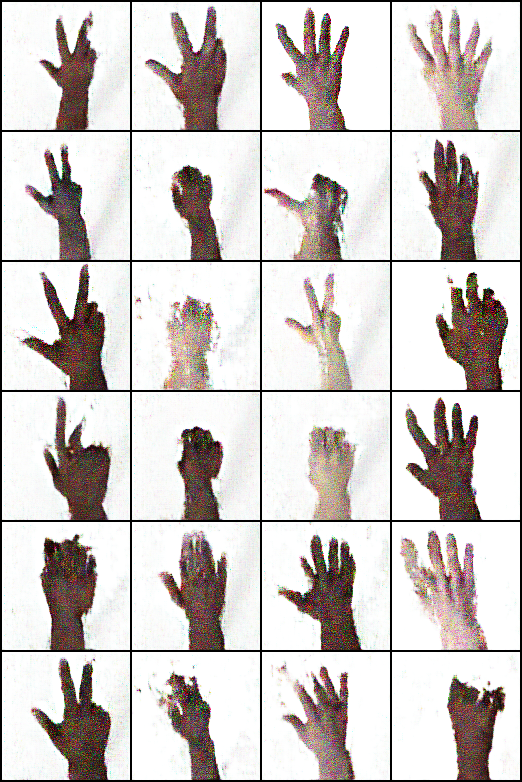

Saving model training check point


In [20]:
num_epochs = 200
start_epoch = 1
checkpoint_file = 'checkpoint.pt'

if os.path.isfile(checkpoint_file):
    print("checkpoint.pt exist.. loading last checkpoint")
    checkpoint = torch.load(checkpoint_file)
    generator.load_state_dict(checkpoint['g_state_dict'])
    discriminator.load_state_dict(checkpoint['d_state_dict'])
    G_optimizer.load_state_dict(checkpoint['g_optimizer'])
    D_optimizer.load_state_dict(checkpoint['d_optimizer'])
    start_epoch = checkpoint['epoch']

D_loss_plot, G_loss_plot = [], []
for epoch in range(start_epoch, num_epochs+1): 

    D_loss_list, G_loss_list = [], []
   
    for index, (real_images, labels) in enumerate(train_loader):
        D_optimizer.zero_grad()
        real_images = real_images.to(device)
        labels = labels.to(device)
        labels = labels.unsqueeze(1).long()

        real_target = Variable(torch.ones(real_images.size(0), 1).to(device))
        fake_target = Variable(torch.zeros(real_images.size(0), 1).to(device))
      
        D_real_loss = discriminator_loss(discriminator((real_images, labels)), real_target)
        # print(discriminator(real_images))
        noise_vector = torch.randn(real_images.size(0), latent_dim, device=device)  
        noise_vector = noise_vector.to(device)
               
        generated_image = generator((noise_vector, labels))
        output = discriminator((generated_image.detach(), labels))
        D_fake_loss = discriminator_loss(output,  fake_target)

        D_total_loss = (D_real_loss + D_fake_loss) / 2
        D_loss_list.append(D_total_loss)
      
        D_total_loss.backward()
        D_optimizer.step()

        # Train generator with real labels
        G_optimizer.zero_grad()
        G_loss = generator_loss(discriminator((generated_image, labels)), real_target)
        G_loss_list.append(G_loss)

        G_loss.backward()
        G_optimizer.step()

    print('Epoch: [%d/%d]: D_loss: %.3f, G_loss: %.3f' % (
            (epoch), num_epochs, torch.mean(torch.FloatTensor(D_loss_list)),\
             torch.mean(torch.FloatTensor(G_loss_list))))
    
    D_loss_plot.append(torch.mean(torch.FloatTensor(D_loss_list)))
    G_loss_plot.append(torch.mean(torch.FloatTensor(G_loss_list)))

    #saving outputs every Nth time
    if (epoch) % 10 == 0:
        checkpoint = {
            'epoch': epoch,
            'd_state_dict': discriminator.state_dict(),
            'g_state_dict': generator.state_dict(),
            'g_optimizer': G_optimizer.state_dict(),
            'd_optimizer': D_optimizer.state_dict()
        }
                
        filename = 'Sample_epoch_%d'% epoch + '.png'
        print("Saving sample output {}".format(filename))
        save_image(generated_image.data[:50], filename, nrow=4, normalize=True)
        display(Image.open(filename))
        
        torch.save(generator.state_dict(), 'generator_epoch_%d.pth' % (epoch))
        torch.save(discriminator.state_dict(), 'discriminator_epoch_%d.pth' % (epoch))

        print ("Saving model training check point")
        torch.save(checkpoint, checkpoint_file)

In [21]:
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

In [22]:
# evaluate the trained model
from numpy.random import randn

generator = Generator().to(device)
generator.load_state_dict(torch.load('generator_epoch_200.pth'), strict=False)
generator.eval()

Generator(
  (label_conditioned_generator): Sequential(
    (0): Embedding(3, 100)
    (1): Linear(in_features=100, out_features=16, bias=True)
  )
  (latent): Sequential(
    (0): Linear(in_features=100, out_features=8192, bias=True)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (model): Sequential(
    (0): ConvTranspose2d(513, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=0.8, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_si

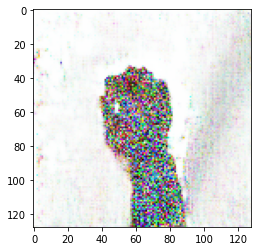

In [23]:
label = 1
labels = torch.ones(1) * label
labels = labels.to(device)
labels = labels.unsqueeze(1).long()

noise_vector = torch.randn(1, latent_dim, device=device)  
noise_vector = noise_vector.to(device)
generated_image = generator((noise_vector, labels))
generated_image = generated_image.permute(0,2,3,1)
generated_image = generated_image.detach().cpu() * 255
generated_image = np.array(generated_image) 
plt.imshow(generated_image[0].astype(np.uint8))